In [2]:
import os
import pandas as pd
import numpy as np
import numpy as np
import seaborn as sns
import matplotlib.pylab as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import mean_absolute_error
%matplotlib inline

In [3]:
#Loading the y-paramter from file, might be changed to y_a etc.
y_a = pd.read_parquet('../Data_and_task/A/train_targets.parquet')
y_b = pd.read_parquet('../Data_and_task/B/train_targets.parquet')
y_c = pd.read_parquet('../Data_and_task/C/train_targets.parquet')

In [4]:
#Loading estimated/forecasted training_weather from file
X_estimated_a = pd.read_parquet('../Data_and_task/A/X_train_estimated.parquet')
X_estimated_b = pd.read_parquet('../Data_and_task/B/X_train_estimated.parquet')
X_estimated_c = pd.read_parquet('../Data_and_task/C/X_train_estimated.parquet')

In [5]:
#Loading observed weather from file
X_observed_a = pd.read_parquet('../Data_and_task/A/X_train_observed.parquet')
X_observed_b = pd.read_parquet('../Data_and_task/B/X_train_observed.parquet')
X_observed_c = pd.read_parquet('../Data_and_task/C/X_train_observed.parquet')

In [6]:
def resize_training_data(X_train, y_train):
    y_features = y_train.columns.tolist()
    X_date_feature = "date_forecast"
    
    merged = pd.merge(X_train, y_train,left_on=X_date_feature, right_on='time', how='inner')
    y_train_resized = merged[y_features]
    columns_to_drop = y_features + [X_date_feature]
    X_train_resized = merged.drop(columns = columns_to_drop)
    return X_train_resized, y_train_resized

# Correlation

absolute_humidity_2m:gm3     air_density_2m:kgm3   -0.811630
                             dew_point_2m:K         0.974607
                             t_1000hPa:K            0.907083
air_density_2m:kgm3          dew_point_2m:K        -0.845869
                             t_1000hPa:K           -0.917245
ceiling_height_agl:m         cloud_base_agl:m       0.709431
clear_sky_energy_1h:J        clear_sky_rad:W        0.992517
                             diffuse_rad:W          0.912133
                             diffuse_rad_1h:J       0.923205
                             direct_rad:W           0.725202
                             direct_rad_1h:J        0.737702
                             is_day:idx             0.646241
                             is_in_shadow:idx      -0.687676
                             sun_elevation:d        0.835068
clear_sky_rad:W              diffuse_rad:W          0.918115
                             diffuse_rad_1h:J       0.915686
                        

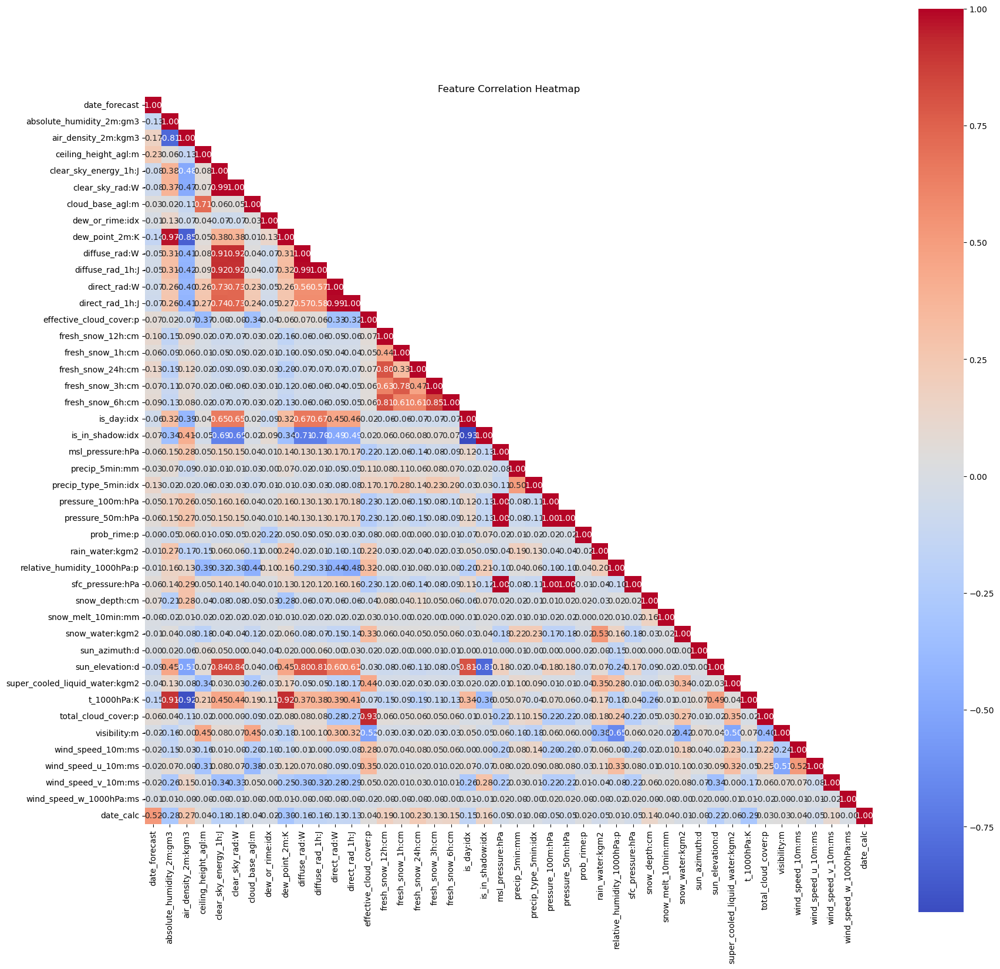

In [7]:
#Training, validation and test
X_train_observed_a = X_observed_a.drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_train_estimated_a = X_estimated_a[:int(X_estimated_a.shape[0] * 3 / 4)].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_valid_estimated_a = X_estimated_a[int(X_estimated_a.shape[0] * 3 / 4):int(X_estimated_a.shape[0] * 9 / 10)].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()
X_test_estimated_a = X_estimated_a[int(X_estimated_a.shape[0] * 9 / 10):].drop(columns =["elevation:m", "snow_density:kgm3", "snow_drift:idx"]).copy()

df = pd.concat([X_train_observed_a, X_train_estimated_a], ignore_index=True)

# Compute the correlation matrix
corr_matrix = df.corr()

# Create mask for upper triangle of the matrix
mask_upper = np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)

# Filter out correlations based on the range
strongly_correlated_pairs = corr_matrix.where(
    mask_upper & ((corr_matrix >= 0.6) | (corr_matrix <= -0.6))
).stack()

print(strongly_correlated_pairs)

# Plot the heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True, square=True, fmt='.2f', mask=mask_upper)
plt.title("Feature Correlation Heatmap")
plt.show()

In [29]:
display(X_observed_a)

,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,...,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms
0,2019-06-02 22:00:00,7.7,1.230,1744.900024,0.0,0.0,1744.900024,0.0,280.299988,0.0,...,342.834015,-3.202000,0.0,285.899994,100.0,39640.101562,3.7,-3.6,-0.8,-0.0
1,2019-06-02 22:15:00,7.7,1.229,1734.000000,0.0,0.0,1734.000000,0.0,280.299988,0.0,...,346.294006,-3.650000,0.0,286.100006,100.0,40123.898438,3.6,-3.6,-0.6,-0.0
2,2019-06-02 22:30:00,7.7,1.228,1723.500000,0.0,0.0,1723.500000,0.0,280.299988,0.0,...,349.768005,-3.998000,0.0,286.299988,100.0,40628.300781,3.6,-3.6,-0.4,-0.0
3,2019-06-02 22:45:00,7.7,1.226,1713.400024,0.0,0.0,1713.400024,0.0,280.299988,0.0,...,353.251007,-4.247000,0.0,286.600006,100.0,41153.601562,3.5,-3.5,-0.2,-0.0
4,2019-06-02 23:00:00,7.7,1.225,1703.599976,0.0,0.0,1703.599976,0.0,280.299988,0.0,...,356.742004,-4.393000,0.0,286.799988,100.0,41699.898438,3.5,-3.5,0.0,-0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118664,2022-10-21 00:00:00,5.0,1.292,NaN,0.0,0.0,NaN,0.0,273.700012,0.0,...,16.612000,-36.306000,0.0,276.899994,2.8,25791.000000,1.3,-0.4,1.2,-0.0
118665,2022-10-21 00:15:00,5.0,1.292,NaN,0.0,0.0,NaN,0.0,273.700012,0.0,...,21.132999,-35.762001,0.0,276.799988,2.3,28560.599609,1.4,-0.6,1.2,-0.0
118666,2022-10-21 00:30:00,5.0,1.292,NaN,0.0,0.0,NaN,0.0,273.700012,0.0,...,25.594000,-35.095001,0.0,276.600006,1.7,31317.800781,1.4,-0.8,1.2,-0.0
118667,2022-10-21 00:45:00,5.0,1.292,NaN,0.0,0.0,NaN,0.0,273.600006,0.0,...,29.988001,-34.311001,0.0,276.500000,1.1,34062.601562,1.5,-1.0,1.1,-0.0


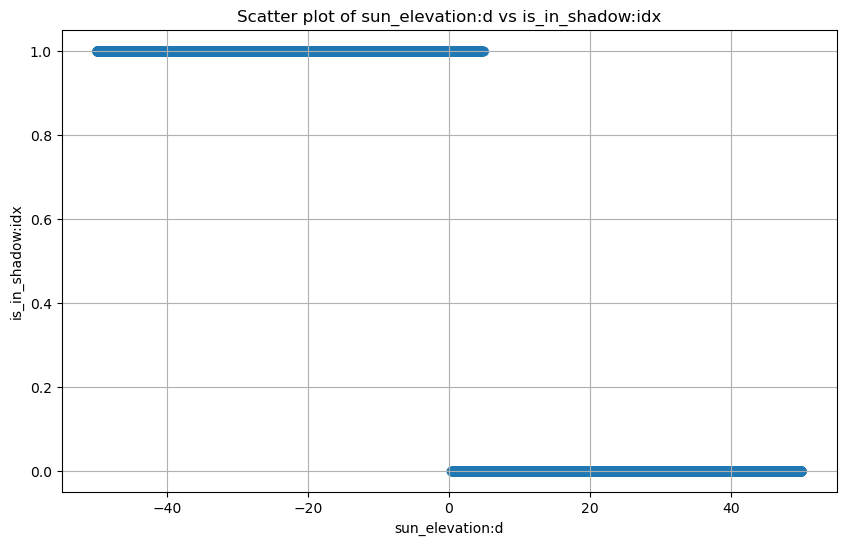

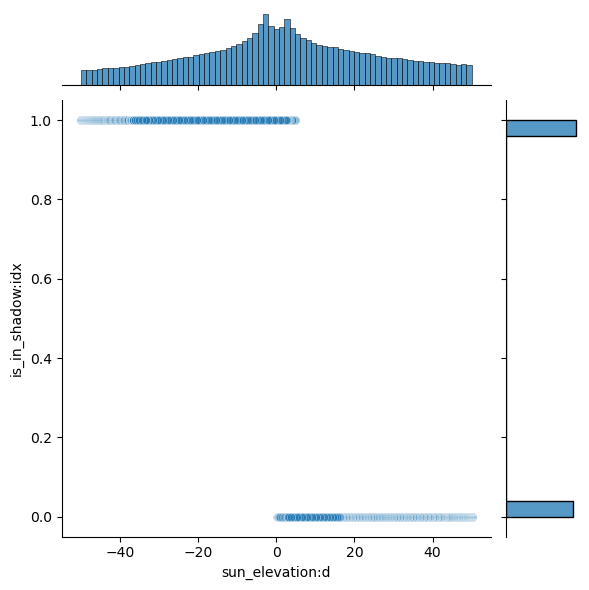

In [8]:
# Assuming df is your DataFrame
feature1 = "sun_elevation:d"  # Replace with the name of your first feature
feature2 = "is_in_shadow:idx"  # Replace with the name of your second feature

plt.figure(figsize=(10, 6))
plt.scatter(X_observed_a[feature1], X_observed_a[feature2], alpha=0.5)
plt.title(f"Scatter plot of {feature1} vs {feature2}")
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.grid(True)
plt.show()

sns.jointplot(data=X_observed_a, x=feature1, y=feature2, kind='scatter', joint_kws={'alpha':0.5})
plt.show()

# Checking for diffences in the datasets, min, max, mean

In [9]:
y_a = y_a[y_a['pv_measurement'] != 0]
statistics = y_a.describe()
print(statistics)

                             time  pv_measurement
count                       18045    18045.000000
mean   2021-04-26 01:05:44.139651     1191.123336
min           2019-06-03 02:00:00        0.220000
25%           2020-05-25 16:00:00      127.820000
50%           2021-05-15 02:00:00      599.940000
75%           2022-05-06 14:00:00     1838.980000
max           2023-04-30 19:00:00     5733.420000
std                           NaN     1378.401846


In [10]:
y_b = y_b[y_b['pv_measurement'] != 0]
statistics = y_b.describe()
print(statistics)

                             time  pv_measurement
count                       15536    15532.000000
mean   2020-10-31 11:38:48.784757      204.745881
min           2019-01-01 10:00:00        0.000208
25%           2019-10-22 09:45:00       28.939212
50%           2020-08-19 06:30:00      115.575000
75%           2021-08-07 10:15:00      276.000000
max           2023-04-30 19:00:00     1152.300000
std                           NaN      239.679247


In [11]:
y_c = y_c[y_c['pv_measurement'] != 0]
statistics = y_c.describe()
print(statistics)

                             time  pv_measurement
count                       16203    10143.000000
mean   2020-07-15 02:42:29.083503      199.722222
min           2018-12-31 23:00:00        0.980000
25%           2019-06-18 17:30:00       36.260000
50%           2020-06-01 04:00:00      117.600000
75%           2021-06-13 23:00:00      294.000000
max           2023-04-30 20:00:00      999.600000
std                           NaN      215.301692


# Scatterplots

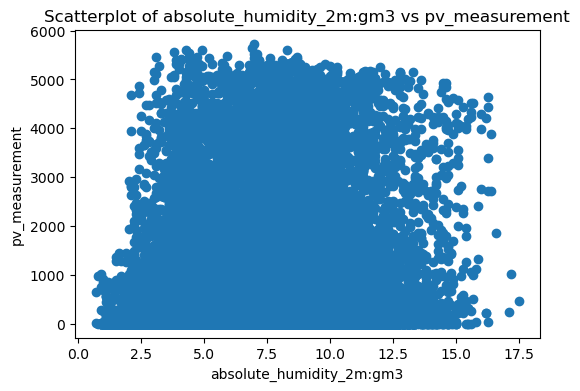

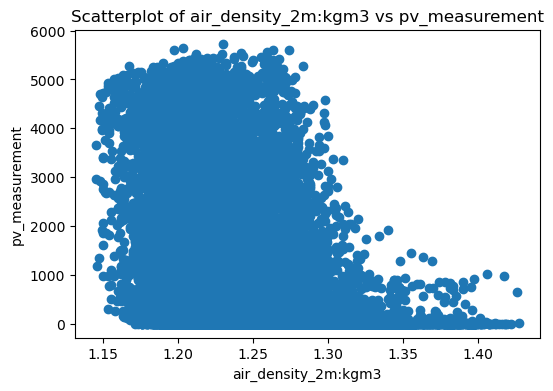

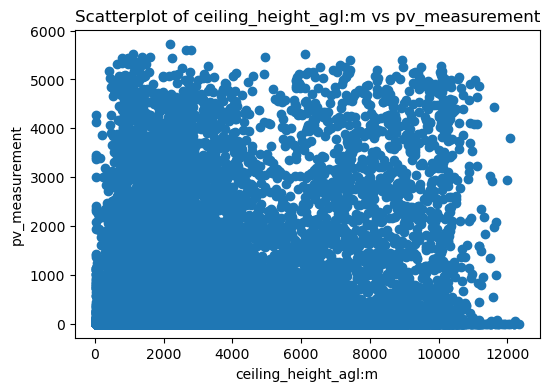

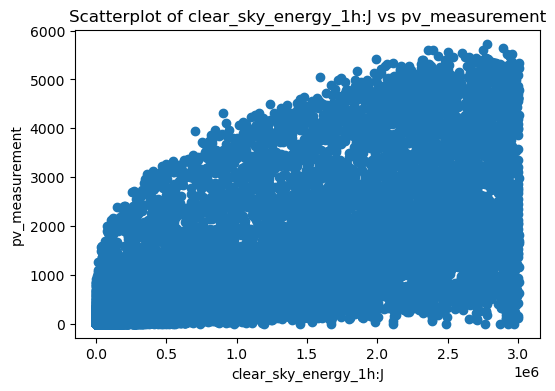

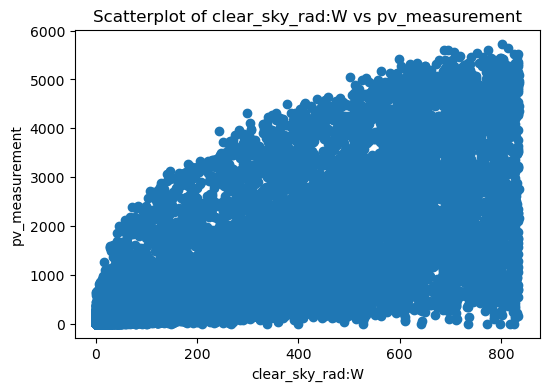

...

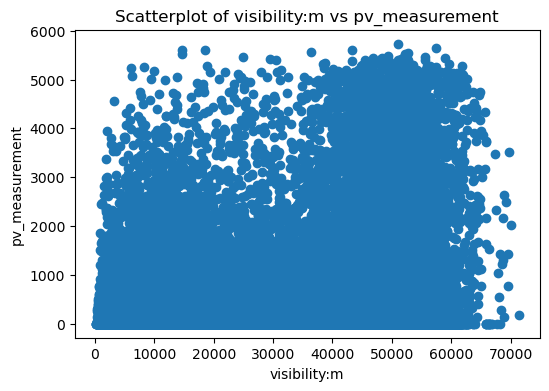

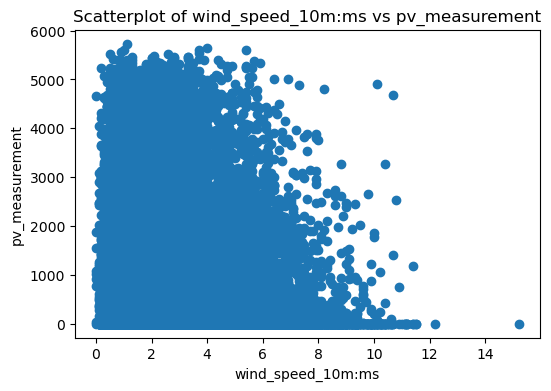

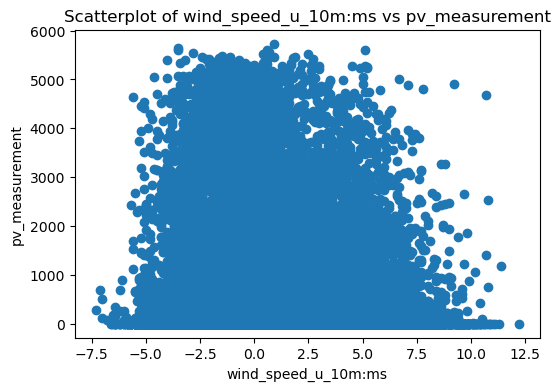

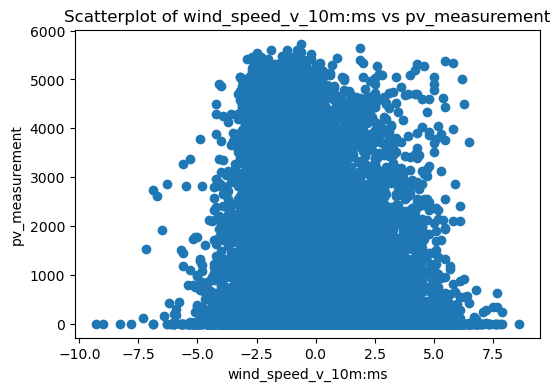

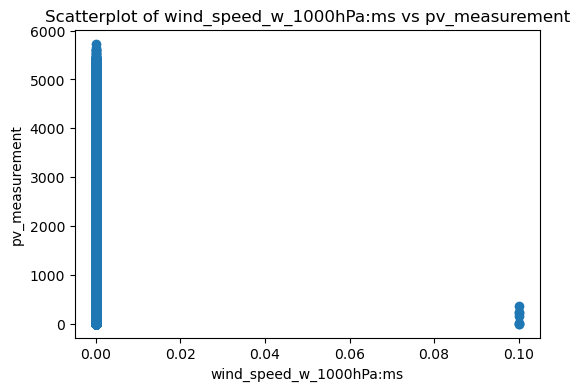

In [8]:
# Assuming df_target has a single column named 'target'
target_column = 'pv_measurement'
df_features, df_target = resize_training_data(X_observed_a, y_a)

# Looping through each feature column in the DataFrame
for feature in df_features.columns:
    plt.figure(figsize=(6, 4))
    
    # Create a scatter plot for each feature vs the target
    plt.scatter(df_features[feature], df_target[target_column])
    
    # Adding title and labels
    plt.title(f'Scatterplot of {feature} vs {target_column}')
    plt.xlabel(feature)
    plt.ylabel(target_column)
    
    # Display the plot
    plt.show()

# Seaborn scatterplots with lin_func

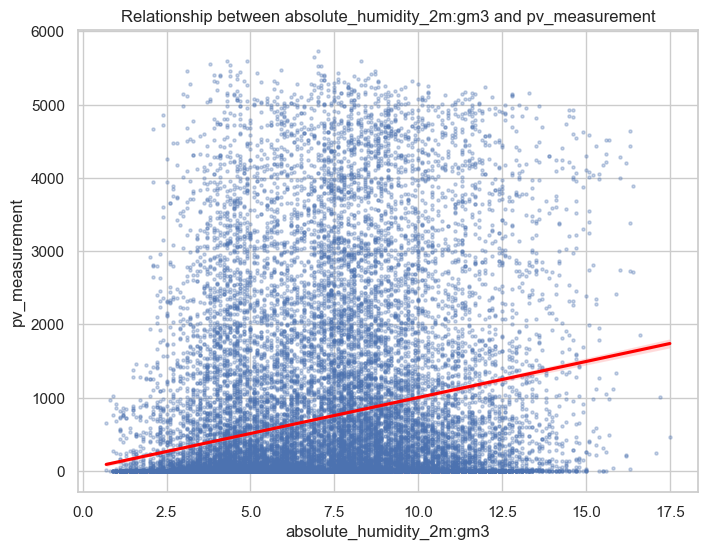

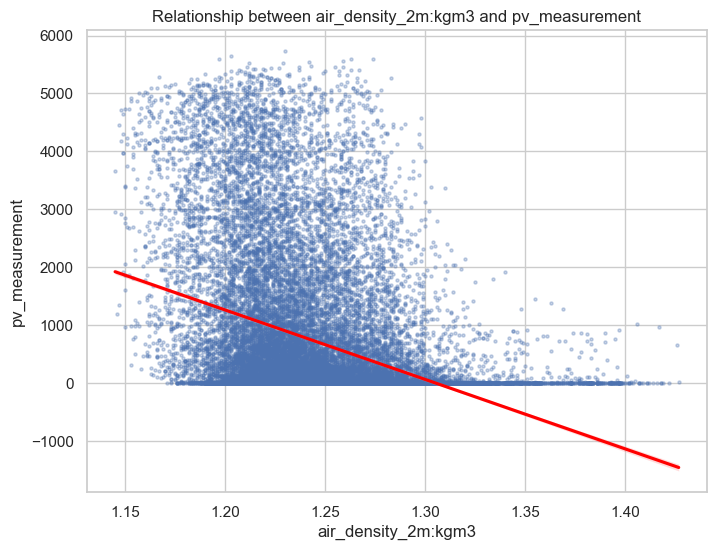

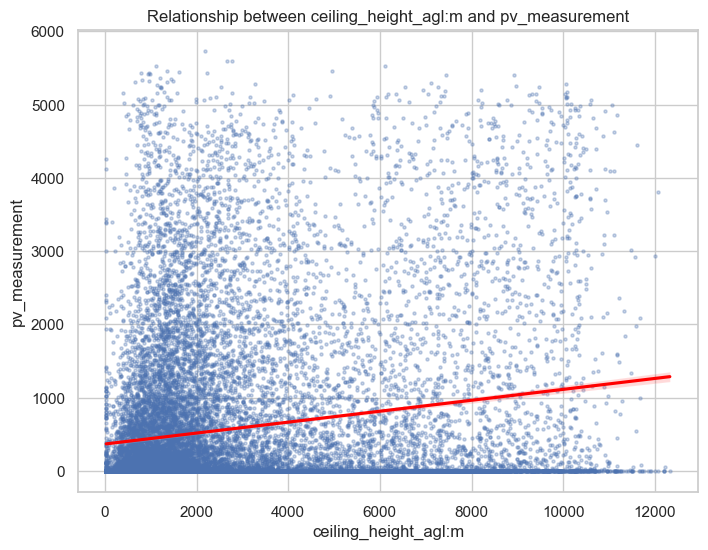

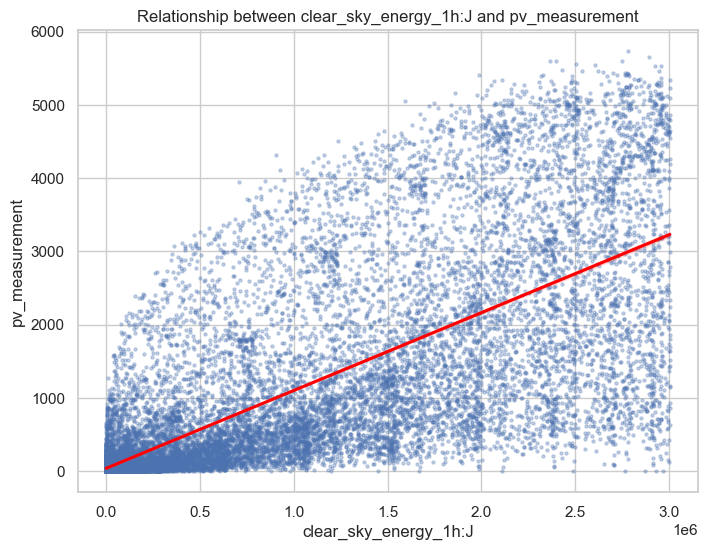

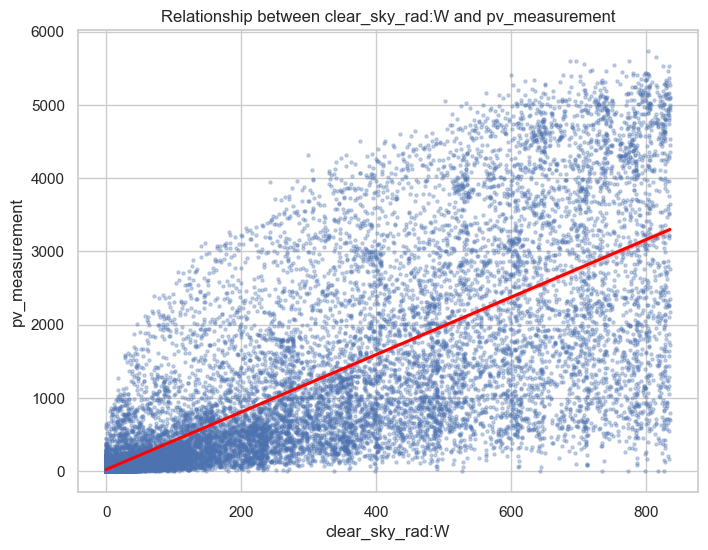

...

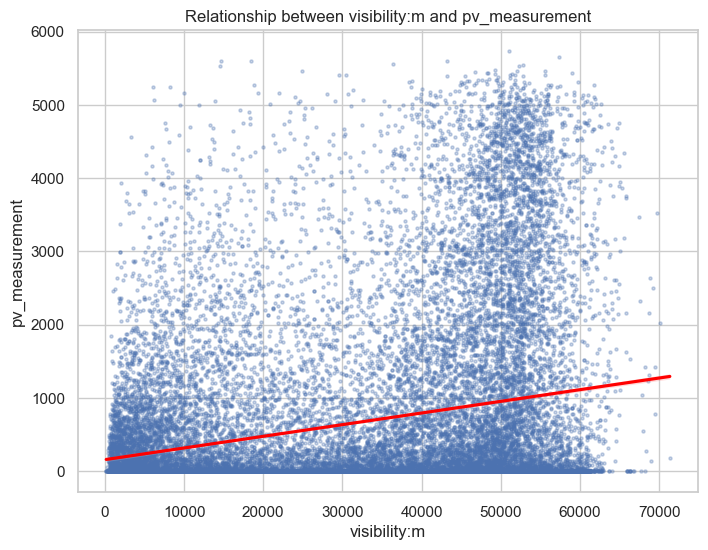

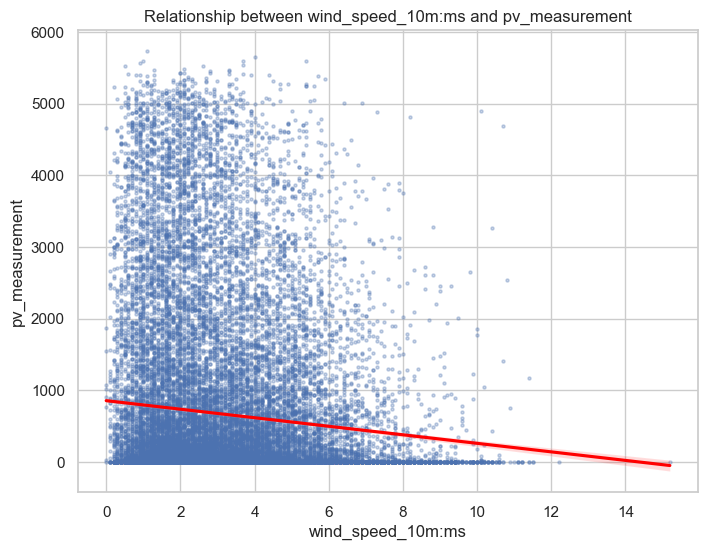

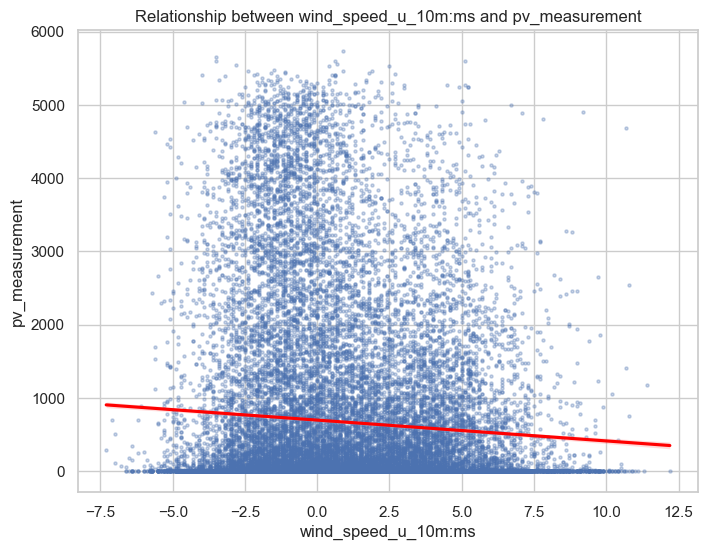

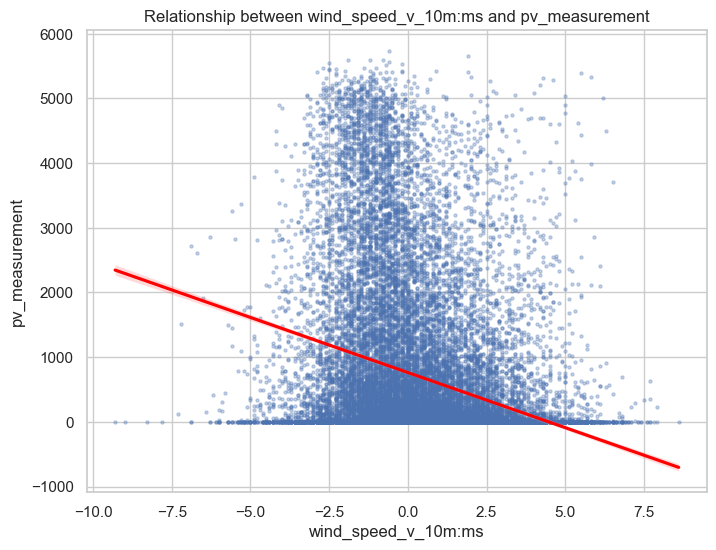

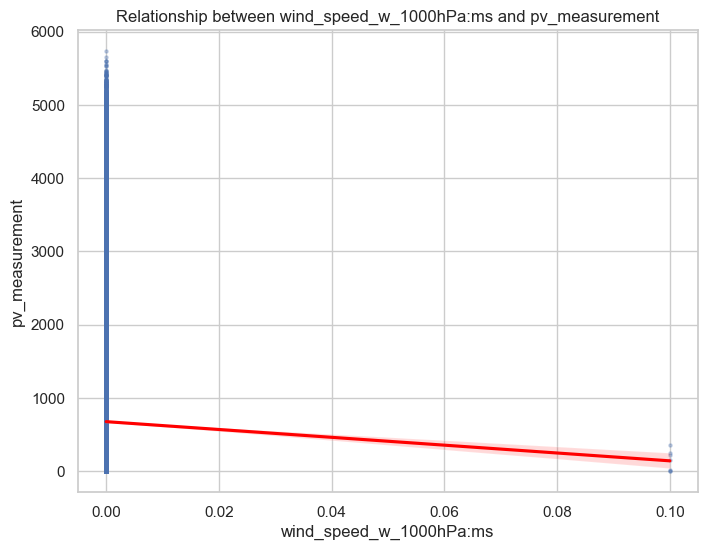

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Adjusting the style of the plots
sns.set(style="whitegrid")

for feature in df_features.columns:
    plt.figure(figsize=(8, 6))
    
    # Creating a scatterplot with a regression line
    sns.regplot(x=df_features[feature], y=df_target[target_column], scatter_kws={'s':5, 'alpha':0.3}, line_kws={'color':'red'})
    
    # Adding titles and labels
    plt.title(f'Relationship between {feature} and {target_column}')
    plt.xlabel(feature)
    plt.ylabel(target_column)
    
    # Displaying the plot
    plt.show()

# Normalized scatterplots [-1,1]

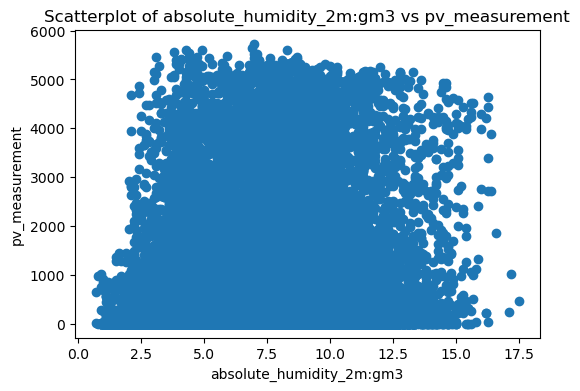

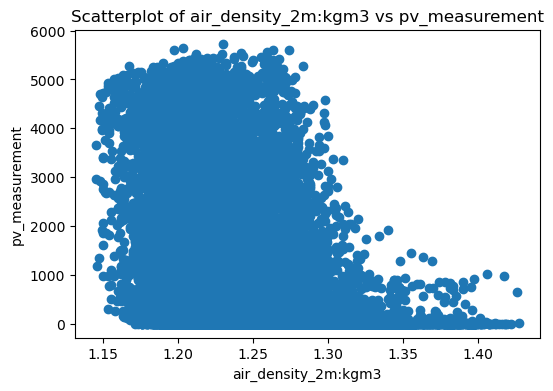

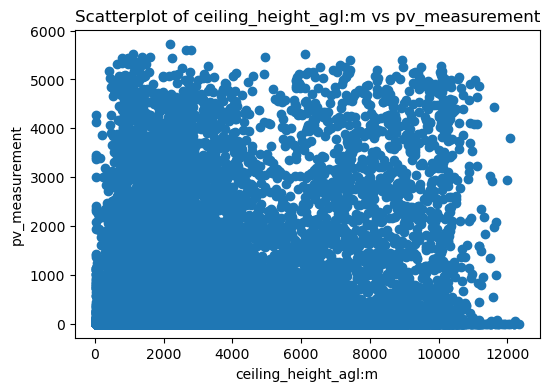

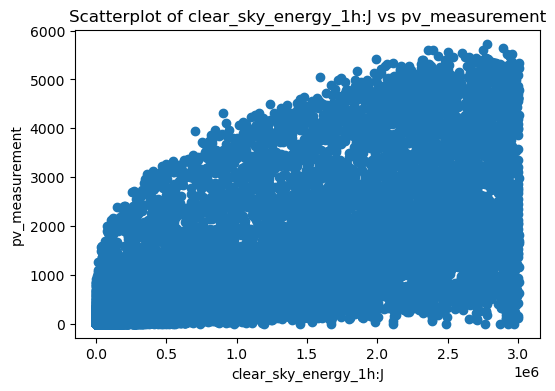

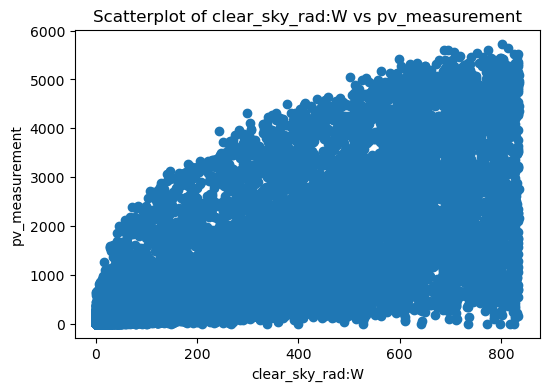

...

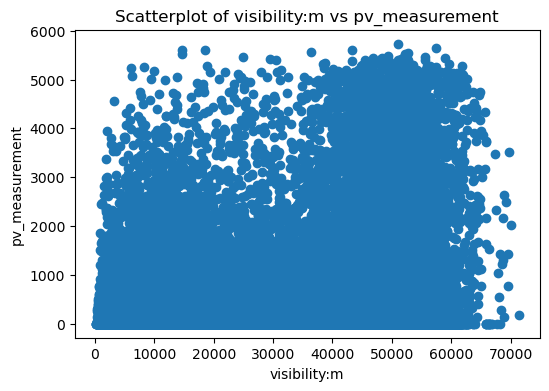

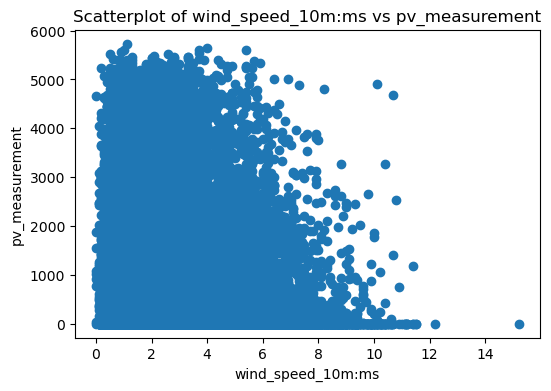

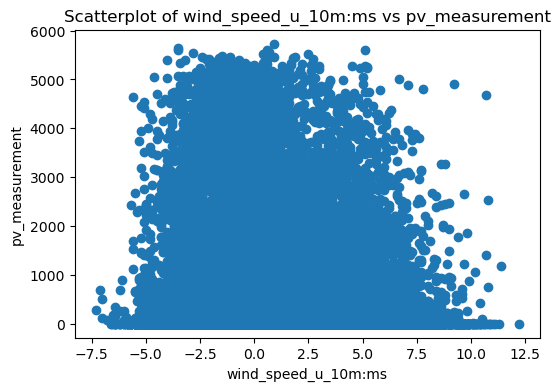

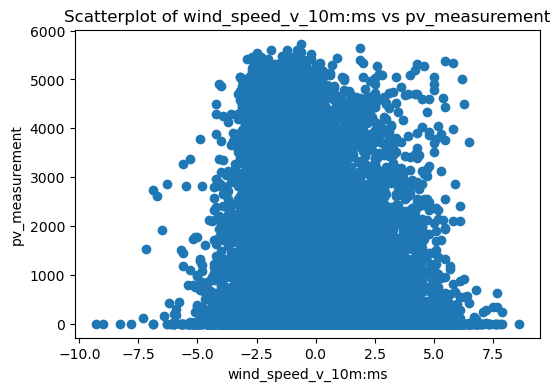

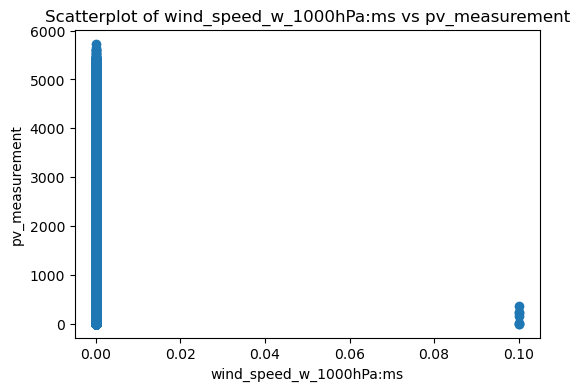

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Assuming resize_training_data returns pandas DataFrames
df_scaled_features, df_target = resize_training_data(X_observed_a, y_a)

#scaler = MinMaxScaler(feature_range=(-1, 1))
#scaled_features = scaler.fit_transform(df_features)

#df_scaled_features = df_scaled_features.map(lambda x: np.power(x,3) if x > 0 else x)
# Converting scaled features from ndarray to DataFrame
#df_scaled_features = pd.DataFrame(scaled_features, columns=df_features.columns)

# Looping through each feature column in the DataFrame
for feature in df_scaled_features.columns:
    plt.figure(figsize=(6, 4))
    
    # Create a scatter plot for each feature vs the target
    plt.scatter(df_scaled_features[feature], df_target['pv_measurement'])
    
    # Adding title and labels
    plt.title(f'Scatterplot of {feature} vs pv_measurement')
    plt.xlabel(feature)
    plt.ylabel('pv_measurement')
    
    # Display the plot
    plt.show()


# PCA

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Assume df is your DataFrame, and target is what you want to predict
X, y = resize_training_data(X_observed_a, y_a)
y = y["pv_measurement"]
X.fillna(X.mean(), inplace=True)
# Splitting the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Applying PCA
pca = PCA(n_components=2)  # choose the number of components
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Now, you can use X_train_pca and X_test_pca for modeling

/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():


In [14]:
X_observed_a
df_features, df_target = resize_training_data(X_observed_a, y_a)
def preprocess_data(df):
    # Handling missing values by filling them with the mean of each column
    df.fillna(df.mean(), inplace=True)
    
    # Replacing infinite values with NaN
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    # Dropping rows that still have NaN values
    df.dropna(inplace=True)
    
    return df

# Preprocess both the feature and target DataFrames
df_features = preprocess_data(df_features.copy())
df_target = preprocess_data(df_target.copy())

# Ensure that the DataFrames have the same index
common_index = df_features.index.intersection(df_target.index)
df_features = df_features.loc[common_index]
df_target = df_target.loc[common_index]


In [16]:
import itertools
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error



def evaluate_combinations(X_df, y_df, target_column):
    X = X_df.copy()
    y = y_df[target_column].values
    
    # Splitting the data into training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    features = X.columns
    results = []
    
    for r in range(1, len(features)+1):
        # Creating combinations of features of length r
        for subset in itertools.combinations(features, r):
            selected_features = list(subset)
            
            # Fitting and evaluating the model
            model = LinearRegression().fit(X_train[selected_features], y_train)
            predictions = model.predict(X_test[selected_features])
            mae = mean_absolute_error(y_test, predictions)
            
            results.append({
                'features': selected_features,
                'mae': mae
            })
    
    # Converting results to DataFrame and sorting by mse
    results_df = pd.DataFrame(results)
    results_df = results_df.sort_values(by='mae', ascending=True)
    
    return results_df

selected_features = ["direct_rad:W", "clear_sky_rad:W" , "diffuse_rad:W","is_in_shadow:idx", "relative_humidity_1000hPa:p",
                     "sun_azimuth:d", "sun_elevation:d", "wind_speed_v_10m:ms", "fresh_snow_3h:cm"]
df_features = df_features[selected_features]

# Run the function
results = evaluate_combinations(df_features, df_target, 'pv_measurement')

# Display the results
print(results)

/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623

                                              features         mse
257  [direct_rad:W, clear_sky_rad:W, diffuse_rad:W,...  252.739718
389  [direct_rad:W, clear_sky_rad:W, diffuse_rad:W,...  252.922410
129  [direct_rad:W, clear_sky_rad:W, diffuse_rad:W,...  252.929131
259  [direct_rad:W, clear_sky_rad:W, diffuse_rad:W,...  253.105568
132  [direct_rad:W, clear_sky_rad:W, diffuse_rad:W,...  256.154727
..                                                 ...         ...
44             [wind_speed_v_10m:ms, fresh_snow_3h:cm]  805.582963
7                                [wind_speed_v_10m:ms]  805.679335
41                   [sun_azimuth:d, fresh_snow_3h:cm]  850.316487
5                                      [sun_azimuth:d]  851.195091
8                                   [fresh_snow_3h:cm]  851.924641

[511 rows x 2 columns]


/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
/Users/simenfritzner/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:623

In [24]:
print(results.iloc[0]["features"])

['direct_rad:W', 'clear_sky_rad:W', 'diffuse_rad:W', 'is_in_shadow:idx', 'sun_elevation:d']
